In [1]:
import geopandas as gpd
import pandas as pd
import os
from glob import glob

# 20210409_missing_isd

The purpose of this notebook is to document the "missing ISD" problem. Specifically, we would like geospatial boundaries (`.shp` files) for all ISDs that intersect with Austin-Round Rock MSA.

In general, these data can be found in the [SABS survey](https://nces.ed.gov/programs/edge/SABS). Kelly and I are using the 2015-16 survey. However, some ISDs are missing in the SABS data because some ISDs do not report. Austin ISD is an example, and they report their boundary data separately (data in `data/aisd_shapefiles`). Even after stubbing in the Austin data, there are clearly ISDs that are unaccounted for in the SABS data. The list of these ISDs is documented in `data/SABS_1516_SchoolLevels/District_Nonresponse.xls`.

The overall goal of this mini-project is to find geospatial (`.shp`) data for all ISDs that:
- Are listed in [missing ISDs](../../data/SABS_1516_SchoolLevels/District_Nonresponse.xls)
- Intersect with Austin-Round Rock MSA (heretofore referred to as "the MSA")
- Are not Austin ISD, since we already have this one

Below, I'll show how to find the ISDs in the SABS data that overlap the MSA. We'll be using pandas and geopandas primarily.


Read in shapefiles for 2015-16 [SABS survey](https://nces.ed.gov/programs/edge/SABS) (`sabs` which lacks Burnet and Austin ISD), and 2018 Census MSAs (`msas`). The SABS shapefile is a large file that isn't in this repository; ping Kelly or me for this file if it does not exist.

In [2]:
data_dir = '../../data/'
sabs_shp_usa = gpd.read_file(os.path.join(data_dir, 'SABS_1516_SchoolLevels/SABS_1516_Primary.shp'))

Here, we load the shapefiles for all MSAs in the USA

In [3]:
msa_query = os.path.join(data_dir, '2018_msas/*cbsa*.shp')

In [4]:
def get_msas(query: str) -> gpd.GeoDataFrame:
    """Concatenates all GDFs in glob `query`"""
    gdfs = [gpd.read_file(fp) for fp in glob(query)]
    assert gdfs, "query returned null"
    return gpd.GeoDataFrame(pd.concat(gdfs))

In [5]:
msas_shp = get_msas(msa_query)

Find the Austin MSA. There are actually 3 rows here for some reason, but this isn't a problem for our purposes.

In [6]:
atx_msas = msas_shp[msas_shp['NAME'].str.contains('Austin-Round', case=False)]
atx_msas.head()

,CSAFP,CBSAFP,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
266,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,"POLYGON ((-98.17298 30.35631, -98.12556 30.426..."
404,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,"POLYGON ((-98.29417 30.04680, -98.28706 30.065..."
385,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,"POLYGON ((-98.17298 30.35631, -98.12556 30.426..."


Next, only use SABS data from Texas, for the sake of convenience and RAM.

In [7]:
sabs_shp = sabs_shp_usa[sabs_shp_usa['stAbbrev'] == 'TX']

Ensure coordinate reference systems (CRS) match.

In [8]:
print(sabs_shp.crs.name)
print(atx_msas.crs.name)

WGS 84 / Pseudo-Mercator
NAD83


Let's convert to the OSM CRS:

In [9]:
atx_msas_osm = atx_msas.to_crs({'init': 'EPSG:3857'})
sabs_osm = sabs_shp

/Users/TASethanho/anaconda3/envs/geopandas/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Double check our work:

In [10]:
assert atx_msas_osm.crs == sabs_osm.crs

## Overlap MSA with ISDs from SABS 

Always nice to plot the data. Below we have the MSA and the ISDs (from SABS) respectively.

<AxesSubplot:>

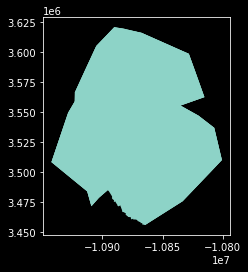

In [11]:
atx_msas_osm.plot()

In [19]:
# uncomment to view all SABS data in TX
# sabs_osm.plot()

Get ISDs that overlap with MSA:

In [13]:
olap_sabs_msa = gpd.overlay(atx_msas_osm, sabs_osm, how="intersection")
olap_sabs_msa.head()

,CSAFP,CBSAFP,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,SrcName,ncessch,...,gslo,gshi,defacto,stAbbrev,openEnroll,Shape_Leng,Shape_Area,level,MultiBdy,geometry
0,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,Dripping Springs,480000801507,...,PK,05,0,TX,0,109636.791042,2.125308e+08,1,0,"MULTIPOLYGON (((-10907410.691 3525489.938, -10..."
1,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,Dripping Springs,480000801507,...,PK,05,0,TX,0,109636.791042,2.125308e+08,1,0,"MULTIPOLYGON (((-10907410.691 3525489.938, -10..."
2,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,Dripping Springs,480000801507,...,PK,05,0,TX,0,109636.791042,2.125308e+08,1,0,"MULTIPOLYGON (((-10907410.691 3525489.938, -10..."
3,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,Walnut Springs,480000806989,...,PK,05,0,TX,0,159876.915178,4.116677e+08,1,0,"POLYGON ((-10929548.860 3546528.893, -10929443..."
4,None,12420,310M400US12420,12420,"Austin-Round Rock, TX",M1,10933857595,151507606,Walnut Springs,480000806989,...,PK,05,0,TX,0,159876.915178,4.116677e+08,1,0,"POLYGON ((-10934563.059 3531713.571, -10934561..."


<AxesSubplot:>

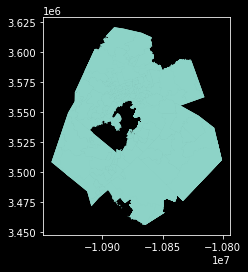

In [14]:
olap_sabs_msa.plot()

Now look again at the MSA.

<AxesSubplot:>

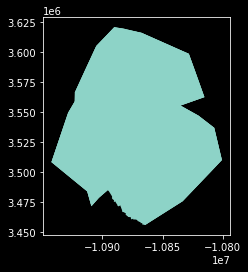

In [15]:
atx_msas_osm.plot()

Notice the missing chunks. We want the MSA plot and the MSA-SABS overlap plot to look the same. The goal here is to find the puzzle pieces, so to speak.

The obvious missing section in the middle is Austin ISD, for which we have data. But we need ISD shapefiles for the other missing "puzzle pieces" such as:
- North piece in Williamson County
- Small missing portion in NW, which I think is Burnet ISD
- Southern chunks

# We have the Austin ISD puzzle piece
As an example, let's try "fitting in the missing puzzle piece" for Austin ISD. We load data from `data/aisd_shapefiles`, and convert to the OSM CRS as before.

/Users/TASethanho/anaconda3/envs/geopandas/lib/python3.9/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<AxesSubplot:>

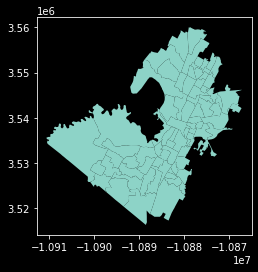

In [16]:
aisd_shp_osm = (
    gpd
    .read_file(os.path.join(data_dir, 'aisd_shapefiles/20_21_elem_updt_v2.shp'))
    .to_crs({'init': 'EPSG:3857'})
)
assert atx_msas_osm.crs == sabs_osm.crs == aisd_shp_osm.crs
aisd_shp_osm.plot()

This looks like the missing piece in the middle. We can try placing it by using the `how='union'` kwarg in [`geopandas.overlay`](https://geopandas.org/docs/user_guide/set_operations.html#the-different-overlay-operations).

<AxesSubplot:>

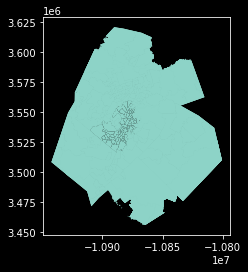

In [17]:
with_aisd = gpd.overlay(olap_sabs_msa, aisd_shp_osm, how="union")
with_aisd.plot()


AISD fits nicely where the SABS data was lacking. We want to do this for the other missing chunks.